In [1]:
import numpy as np
import pandas as pd
import sweetviz as sv
from tqdm import tqdm

In [2]:
pd.set_option('display.max_columns', None)

# Import Data

In [3]:
schema = {}
data = pd.read_csv('../data/train.csv', dtype=schema)
print(data.shape)
data.head()

/Users/jonathan_novak/PycharmProjects/nfl-big-data-bowl-2019/nfl-env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (47) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


(682154, 49)


,GameId,PlayId,Team,X,Y,S,A,Dis,Orientation,Dir,NflId,DisplayName,JerseyNumber,Season,YardLine,Quarter,GameClock,PossessionTeam,Down,Distance,FieldPosition,HomeScoreBeforePlay,VisitorScoreBeforePlay,NflIdRusher,OffenseFormation,OffensePersonnel,DefendersInTheBox,DefensePersonnel,PlayDirection,TimeHandoff,TimeSnap,Yards,PlayerHeight,PlayerWeight,PlayerBirthDate,PlayerCollegeName,Position,HomeTeamAbbr,VisitorTeamAbbr,Week,Stadium,Location,StadiumType,Turf,GameWeather,Temperature,Humidity,WindSpeed,WindDirection
0,2017090700,20170907000118,away,73.91,34.84,1.69,1.13,0.40,81.99,177.18,496723,Eric Berry,29,2017,35,1,14:14:00,NE,3,2,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:06.000Z,2017-09-08T00:44:05.000Z,8,6-0,212,12/29/1988,Tennessee,SS,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW
1,2017090700,20170907000118,away,74.67,32.64,0.42,1.35,0.01,27.61,198.70,2495116,Allen Bailey,97,2017,35,1,14:14:00,NE,3,2,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:06.000Z,2017-09-08T00:44:05.000Z,8,6-3,288,03/25/1989,Miami,DE,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW
2,2017090700,20170907000118,away,74.00,33.20,1.22,0.59,0.31,3.01,202.73,2495493,Justin Houston,50,2017,35,1,14:14:00,NE,3,2,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:06.000Z,2017-09-08T00:44:05.000Z,8,6-3,270,01/21/1989,Georgia,DE,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW
3,2017090700,20170907000118,away,71.46,27.70,0.42,0.54,0.02,359.77,105.64,2506353,Derrick Johnson,56,2017,35,1,14:14:00,NE,3,2,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:06.000Z,2017-09-08T00:44:05.000Z,8,6-3,245,11/22/1982,Texas,ILB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW
4,2017090700,20170907000118,away,69.32,35.42,1.82,2.43,0.16,12.63,164.31,2530794,Ron Parker,38,2017,35,1,14:14:00,NE,3,2,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:06.000Z,2017-09-08T00:44:05.000Z,8,6-0,206,08/17/1987,Newberry,FS,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW


In [4]:
# Data contains information on ALL players during a play but we only care about the running back for this analysis.
idx = data['NflId'] == data['NflIdRusher']
data = data[idx].reset_index(drop=True)
print(data.shape)
data.head()

(31007, 49)


,GameId,PlayId,Team,X,Y,S,A,Dis,Orientation,Dir,NflId,DisplayName,JerseyNumber,Season,YardLine,Quarter,GameClock,PossessionTeam,Down,Distance,FieldPosition,HomeScoreBeforePlay,VisitorScoreBeforePlay,NflIdRusher,OffenseFormation,OffensePersonnel,DefendersInTheBox,DefensePersonnel,PlayDirection,TimeHandoff,TimeSnap,Yards,PlayerHeight,PlayerWeight,PlayerBirthDate,PlayerCollegeName,Position,HomeTeamAbbr,VisitorTeamAbbr,Week,Stadium,Location,StadiumType,Turf,GameWeather,Temperature,Humidity,WindSpeed,WindDirection
0,2017090700,20170907000118,home,78.75,30.53,3.63,3.35,0.38,161.98,245.74,2543773,James White,28,2017,35,1,14:14:00,NE,3,2,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:06.000Z,2017-09-08T00:44:05.000Z,8,5-10,205,02/03/1992,Wisconsin,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW
1,2017090700,20170907000139,home,71.07,27.16,3.06,2.41,0.34,210.70,312.20,2543773,James White,28,2017,43,1,13:52:00,NE,1,10,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:27.000Z,2017-09-08T00:44:26.000Z,3,5-10,205,02/03/1992,Wisconsin,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW
2,2017090700,20170907000189,home,48.66,19.11,5.77,2.42,0.60,140.82,221.96,2543773,James White,28,2017,35,1,13:02:00,NE,1,10,KC,0,0,2543773,SINGLEBACK,"1 RB, 1 TE, 3 WR",7.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:45:17.000Z,2017-09-08T00:45:15.000Z,5,5-10,205,02/03/1992,Wisconsin,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW
3,2017090700,20170907000345,home,15.53,25.36,4.45,3.20,0.46,186.22,275.44,2539663,Mike Gillislee,35,2017,2,1,12:12:00,NE,2,2,KC,0,0,2539663,JUMBO,"6 OL, 2 RB, 2 TE, 0 WR",9.0,"4 DL, 4 LB, 3 DB",left,2017-09-08T00:48:41.000Z,2017-09-08T00:48:39.000Z,2,5-11,210,11/01/1990,Florida,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW
4,2017090700,20170907000395,away,29.99,27.12,3.90,2.53,0.44,34.27,157.92,2557917,Kareem Hunt,27,2017,25,1,12:08:00,KC,1,10,KC,7,0,2557917,SHOTGUN,"1 RB, 3 TE, 1 WR",7.0,"3 DL, 2 LB, 6 DB",right,2017-09-08T00:53:14.000Z,2017-09-08T00:53:13.000Z,7,5-11,216,08/06/1995,Toledo,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW


# Data Quality - Check Schema & Values

In [5]:
# Check Datatypes to identify schema and value issues
data.dtypes

GameId                      int64
PlayId                      int64
Team                       object
X                         float64
Y                         float64
S                         float64
A                         float64
Dis                       float64
Orientation               float64
Dir                       float64
NflId                       int64
DisplayName                object
JerseyNumber                int64
Season                      int64
YardLine                    int64
Quarter                     int64
GameClock                  object
PossessionTeam             object
Down                        int64
Distance                    int64
FieldPosition              object
HomeScoreBeforePlay         int64
VisitorScoreBeforePlay      int64
NflIdRusher                 int64
OffenseFormation           object
OffensePersonnel           object
DefendersInTheBox         float64
DefensePersonnel           object
PlayDirection              object
TimeHandoff   

In [6]:
# WindSpeed is an object but should be a float. Investigate issue and adjust values.
data['WindSpeed'].unique()

array([8.0, 6.0, 10.0, 9.0, 11.0, nan, 7.0, 5.0, 2.0, 12.0, 1, 3, 4, 13,
       '10', '5', '6', '4', '8', '0', 'SSW', 14.0, 0.0, 15.0, 17.0, 18.0,
       16.0, '11-17', '16', '14', '13', '12', '23', '7', '9', '3', '17',
       '14-23', '1', '13 MPH', 24.0, '15', '12-22', '2', '4 MPh',
       '15 gusts up to 25', '11', '10MPH', '10mph', '22', 'E', '7 MPH',
       'Calm', '6 mph', '19', 'SE', '20', '10-20', '12mph', '6mph',
       '9mph', 'SSE', '14 Gusting to 24', '6 mph, Gusts to 10',
       '2 mph, gusts to 5', 23.0, 19, '12 mph', '9 mph, gusts to 13',
       '10 mph, gusts to 15'], dtype=object)

In [7]:
# Unique values shows that there are some strings in the WindSpeed column. Adjust values by converting to a float.
lst_wind_speed = []
for value in tqdm(data['WindSpeed'], desc=f'Looping over {data.shape[0]} instances'):
    try:
        value = float(value)
    except ValueError:
        # Since the string can have a range of values, find digits and take the mean
        tmp_lst = [float(v) for v in value.split() if v.isdigit()]
        if len(tmp_lst) == 0:
            value = None
        else:
            value = sum(tmp_lst)/len(tmp_lst)
    except:
        value = None
    lst_wind_speed.append(value)
    
assert len(lst_wind_speed) == data.shape[0], 'Lengths are different'

Looping over 31007 instances: 100%|█| 31007/31007 [00:00<00:00, 1179820.41it/


In [8]:
# Add new column to data with correction
data['WindSpeed_ADJ'] = lst_wind_speed
data.head()

,GameId,PlayId,Team,X,Y,S,A,Dis,Orientation,Dir,NflId,DisplayName,JerseyNumber,Season,YardLine,Quarter,GameClock,PossessionTeam,Down,Distance,FieldPosition,HomeScoreBeforePlay,VisitorScoreBeforePlay,NflIdRusher,OffenseFormation,OffensePersonnel,DefendersInTheBox,DefensePersonnel,PlayDirection,TimeHandoff,TimeSnap,Yards,PlayerHeight,PlayerWeight,PlayerBirthDate,PlayerCollegeName,Position,HomeTeamAbbr,VisitorTeamAbbr,Week,Stadium,Location,StadiumType,Turf,GameWeather,Temperature,Humidity,WindSpeed,WindDirection,WindSpeed_ADJ
0,2017090700,20170907000118,home,78.75,30.53,3.63,3.35,0.38,161.98,245.74,2543773,James White,28,2017,35,1,14:14:00,NE,3,2,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:06.000Z,2017-09-08T00:44:05.000Z,8,5-10,205,02/03/1992,Wisconsin,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW,8.0
1,2017090700,20170907000139,home,71.07,27.16,3.06,2.41,0.34,210.70,312.20,2543773,James White,28,2017,43,1,13:52:00,NE,1,10,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:27.000Z,2017-09-08T00:44:26.000Z,3,5-10,205,02/03/1992,Wisconsin,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW,8.0
2,2017090700,20170907000189,home,48.66,19.11,5.77,2.42,0.60,140.82,221.96,2543773,James White,28,2017,35,1,13:02:00,NE,1,10,KC,0,0,2543773,SINGLEBACK,"1 RB, 1 TE, 3 WR",7.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:45:17.000Z,2017-09-08T00:45:15.000Z,5,5-10,205,02/03/1992,Wisconsin,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW,8.0
3,2017090700,20170907000345,home,15.53,25.36,4.45,3.20,0.46,186.22,275.44,2539663,Mike Gillislee,35,2017,2,1,12:12:00,NE,2,2,KC,0,0,2539663,JUMBO,"6 OL, 2 RB, 2 TE, 0 WR",9.0,"4 DL, 4 LB, 3 DB",left,2017-09-08T00:48:41.000Z,2017-09-08T00:48:39.000Z,2,5-11,210,11/01/1990,Florida,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW,8.0
4,2017090700,20170907000395,away,29.99,27.12,3.90,2.53,0.44,34.27,157.92,2557917,Kareem Hunt,27,2017,25,1,12:08:00,KC,1,10,KC,7,0,2557917,SHOTGUN,"1 RB, 3 TE, 1 WR",7.0,"3 DL, 2 LB, 6 DB",right,2017-09-08T00:53:14.000Z,2017-09-08T00:53:13.000Z,7,5-11,216,08/06/1995,Toledo,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW,8.0


In [9]:
# PlayerHeight is an object but can convert to inches
data['PlayerHeight'].unique()

array(['5-10', '5-11', '6-1', '5-8', '5-9', '6-2', '6-0', '5-6', '6-3',
       '6-4', '5-7', '6-5', '6-6'], dtype=object)

In [10]:
# Convert to inches by multiplying the feet by 12 and adding the rest of the inches
lst_player_height = []
for value in tqdm(data['PlayerHeight'], desc=f'Looping over {data.shape[0]} instances'):
    tmp_lst = value.split('-')
    inches = int(tmp_lst[0])*12 + int(tmp_lst[1])
    lst_player_height.append(inches)
assert len(lst_player_height) == data.shape[0], 'Lengths are different'

Looping over 31007 instances: 100%|█| 31007/31007 [00:00<00:00, 928848.94it/s


In [11]:
# Add new column to data with correction
data['PlayerHeight_ADJ'] = lst_player_height
data.head()

,GameId,PlayId,Team,X,Y,S,A,Dis,Orientation,Dir,NflId,DisplayName,JerseyNumber,Season,YardLine,Quarter,GameClock,PossessionTeam,Down,Distance,FieldPosition,HomeScoreBeforePlay,VisitorScoreBeforePlay,NflIdRusher,OffenseFormation,OffensePersonnel,DefendersInTheBox,DefensePersonnel,PlayDirection,TimeHandoff,TimeSnap,Yards,PlayerHeight,PlayerWeight,PlayerBirthDate,PlayerCollegeName,Position,HomeTeamAbbr,VisitorTeamAbbr,Week,Stadium,Location,StadiumType,Turf,GameWeather,Temperature,Humidity,WindSpeed,WindDirection,WindSpeed_ADJ,PlayerHeight_ADJ
0,2017090700,20170907000118,home,78.75,30.53,3.63,3.35,0.38,161.98,245.74,2543773,James White,28,2017,35,1,14:14:00,NE,3,2,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:06.000Z,2017-09-08T00:44:05.000Z,8,5-10,205,02/03/1992,Wisconsin,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW,8.0,70
1,2017090700,20170907000139,home,71.07,27.16,3.06,2.41,0.34,210.70,312.20,2543773,James White,28,2017,43,1,13:52:00,NE,1,10,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:27.000Z,2017-09-08T00:44:26.000Z,3,5-10,205,02/03/1992,Wisconsin,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW,8.0,70
2,2017090700,20170907000189,home,48.66,19.11,5.77,2.42,0.60,140.82,221.96,2543773,James White,28,2017,35,1,13:02:00,NE,1,10,KC,0,0,2543773,SINGLEBACK,"1 RB, 1 TE, 3 WR",7.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:45:17.000Z,2017-09-08T00:45:15.000Z,5,5-10,205,02/03/1992,Wisconsin,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW,8.0,70
3,2017090700,20170907000345,home,15.53,25.36,4.45,3.20,0.46,186.22,275.44,2539663,Mike Gillislee,35,2017,2,1,12:12:00,NE,2,2,KC,0,0,2539663,JUMBO,"6 OL, 2 RB, 2 TE, 0 WR",9.0,"4 DL, 4 LB, 3 DB",left,2017-09-08T00:48:41.000Z,2017-09-08T00:48:39.000Z,2,5-11,210,11/01/1990,Florida,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW,8.0,71
4,2017090700,20170907000395,away,29.99,27.12,3.90,2.53,0.44,34.27,157.92,2557917,Kareem Hunt,27,2017,25,1,12:08:00,KC,1,10,KC,7,0,2557917,SHOTGUN,"1 RB, 3 TE, 1 WR",7.0,"3 DL, 2 LB, 6 DB",right,2017-09-08T00:53:14.000Z,2017-09-08T00:53:13.000Z,7,5-11,216,08/06/1995,Toledo,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW,8.0,71


In [12]:
# Birthdate is an object but can convert to years
data['PlayerBirthDate'].unique()

array(['02/03/1992', '11/01/1990', '08/06/1995', '07/02/1990',
       '10/24/1987', '03/01/1994', '01/05/1993', '09/27/1990',
       '06/02/1991', '07/12/1988', '11/23/1985', '10/27/1988',
       '12/10/1985', '03/15/1992', '04/16/1993', '11/02/1994',
       '07/26/1995', '02/01/1992', '10/20/1992', '01/28/1991',
       '08/27/1991', '01/25/1985', '07/24/1996', '11/22/1991',
       '01/25/1991', '01/08/1993', '09/03/1994', '02/18/1992',
       '05/05/1995', '12/16/1991', '06/13/1993', '05/04/1991',
       '04/24/1994', '06/09/1991', '04/03/1990', '08/02/1988',
       '01/18/1995', '04/25/1991', '10/07/1993', '03/22/1988',
       '04/24/1996', '09/10/1990', '04/22/1986', '02/12/1988',
       '03/17/1991', '01/04/1994', '02/22/1993', '10/15/1993',
       '10/20/1990', '10/03/1992', '12/05/1986', '01/20/1994',
       '06/20/1983', '08/03/1994', '05/14/1983', '03/07/1996',
       '03/15/1990', '10/14/1994', '05/15/1993', '12/02/1989',
       '11/11/1995', '06/02/1990', '01/22/1993', '04/03

In [13]:
# To keep it is simple, convert to years by subtracting the season from the birth year
lst_player_birth = []
for i in tqdm(range(data.shape[0]), desc=f'Looping over {data.shape[0]} instances'):
    value = data.loc[i, 'PlayerBirthDate']
    tmp_lst = value.split('/')
    years = data.loc[i, 'Season'] - int(tmp_lst[2])
    lst_player_birth.append(years)
assert len(lst_player_birth) == data.shape[0], 'Lengths are different'

Looping over 31007 instances: 100%|█| 31007/31007 [00:00<00:00, 59954.54it/s]


In [14]:
# Add new column to data with correction
data['PlayerBirthDate_ADJ'] = lst_player_birth
data.head()

,GameId,PlayId,Team,X,Y,S,A,Dis,Orientation,Dir,NflId,DisplayName,JerseyNumber,Season,YardLine,Quarter,GameClock,PossessionTeam,Down,Distance,FieldPosition,HomeScoreBeforePlay,VisitorScoreBeforePlay,NflIdRusher,OffenseFormation,OffensePersonnel,DefendersInTheBox,DefensePersonnel,PlayDirection,TimeHandoff,TimeSnap,Yards,PlayerHeight,PlayerWeight,PlayerBirthDate,PlayerCollegeName,Position,HomeTeamAbbr,VisitorTeamAbbr,Week,Stadium,Location,StadiumType,Turf,GameWeather,Temperature,Humidity,WindSpeed,WindDirection,WindSpeed_ADJ,PlayerHeight_ADJ,PlayerBirthDate_ADJ
0,2017090700,20170907000118,home,78.75,30.53,3.63,3.35,0.38,161.98,245.74,2543773,James White,28,2017,35,1,14:14:00,NE,3,2,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:06.000Z,2017-09-08T00:44:05.000Z,8,5-10,205,02/03/1992,Wisconsin,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW,8.0,70,25
1,2017090700,20170907000139,home,71.07,27.16,3.06,2.41,0.34,210.70,312.20,2543773,James White,28,2017,43,1,13:52:00,NE,1,10,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:27.000Z,2017-09-08T00:44:26.000Z,3,5-10,205,02/03/1992,Wisconsin,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW,8.0,70,25
2,2017090700,20170907000189,home,48.66,19.11,5.77,2.42,0.60,140.82,221.96,2543773,James White,28,2017,35,1,13:02:00,NE,1,10,KC,0,0,2543773,SINGLEBACK,"1 RB, 1 TE, 3 WR",7.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:45:17.000Z,2017-09-08T00:45:15.000Z,5,5-10,205,02/03/1992,Wisconsin,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW,8.0,70,25
3,2017090700,20170907000345,home,15.53,25.36,4.45,3.20,0.46,186.22,275.44,2539663,Mike Gillislee,35,2017,2,1,12:12:00,NE,2,2,KC,0,0,2539663,JUMBO,"6 OL, 2 RB, 2 TE, 0 WR",9.0,"4 DL, 4 LB, 3 DB",left,2017-09-08T00:48:41.000Z,2017-09-08T00:48:39.000Z,2,5-11,210,11/01/1990,Florida,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW,8.0,71,27
4,2017090700,20170907000395,away,29.99,27.12,3.90,2.53,0.44,34.27,157.92,2557917,Kareem Hunt,27,2017,25,1,12:08:00,KC,1,10,KC,7,0,2557917,SHOTGUN,"1 RB, 3 TE, 1 WR",7.0,"3 DL, 2 LB, 6 DB",right,2017-09-08T00:53:14.000Z,2017-09-08T00:53:13.000Z,7,5-11,216,08/06/1995,Toledo,RB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Outdoor,Field Turf,Clear and warm,63.0,77.0,8.0,SW,8.0,71,22


# Run Sweetviz to Auto-Generate EDA Report

In [15]:
#Drop WindSpeed because it will cause issues with generating the report since it is a mixed datatype
data.drop('WindSpeed', axis=1, inplace=True)

                                             |   | [  0%]   00:00 -> (? left)


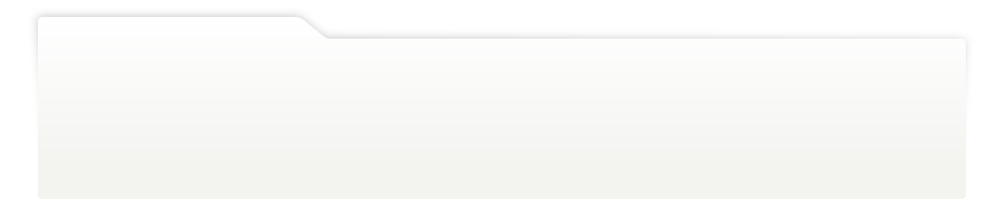
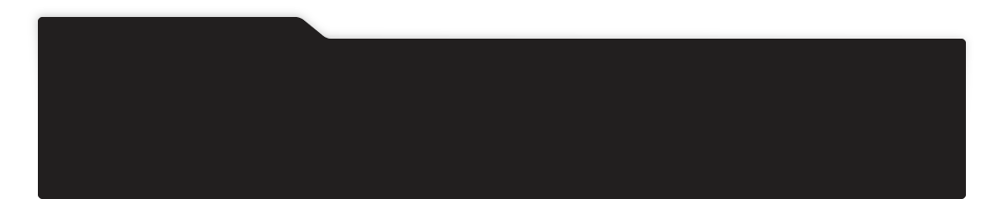
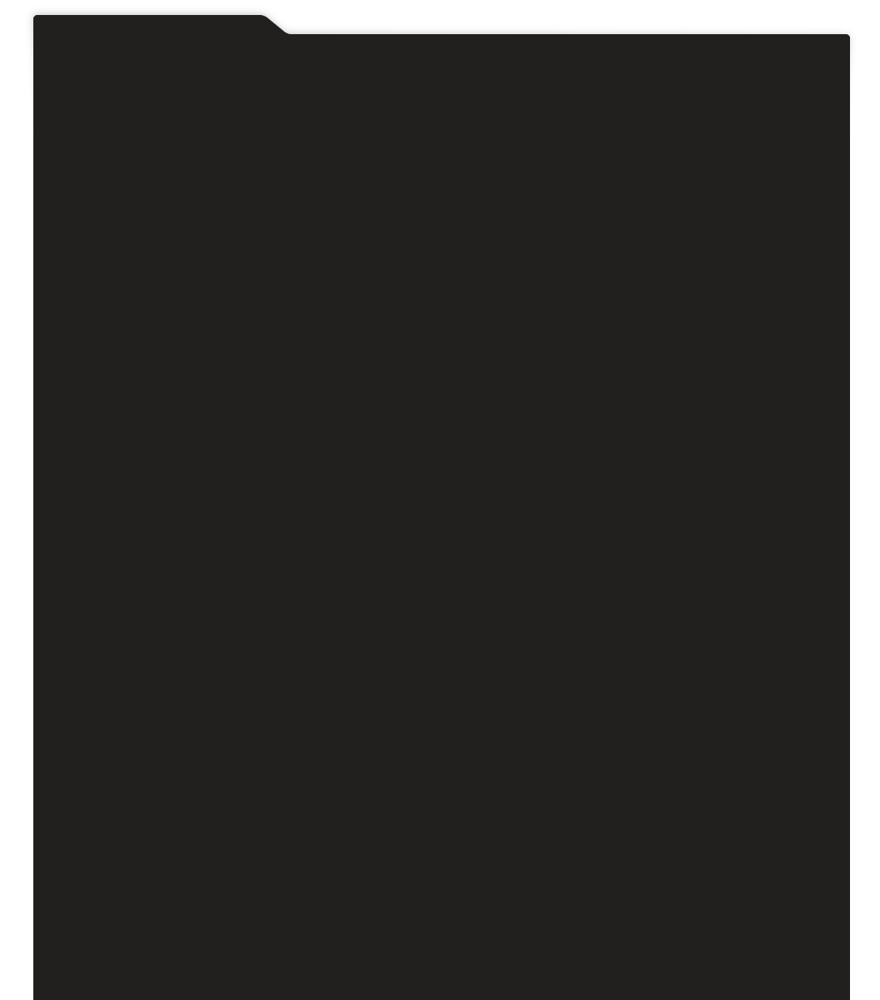
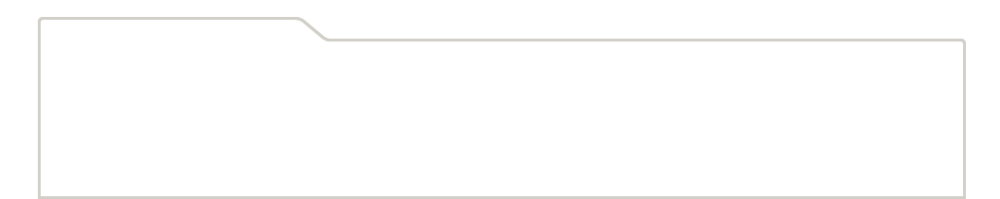
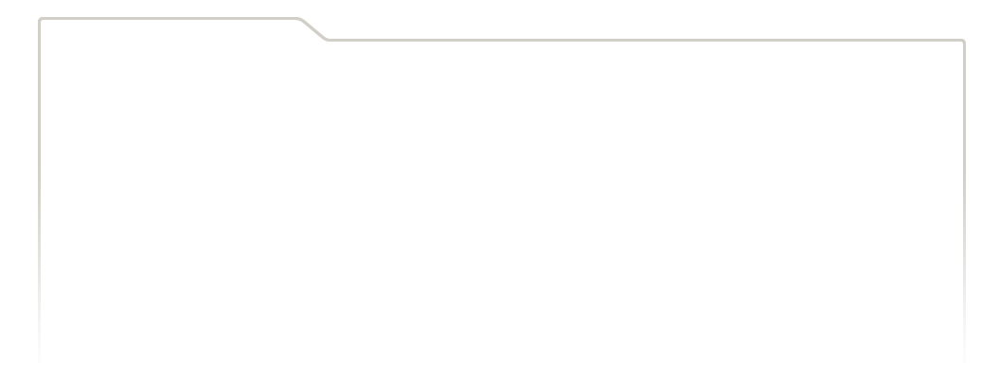
...
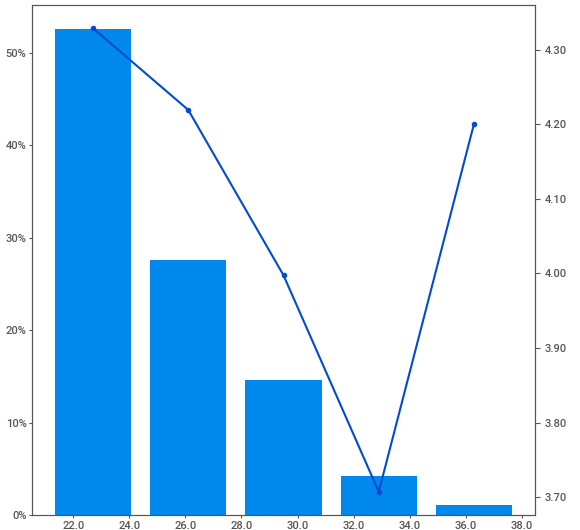
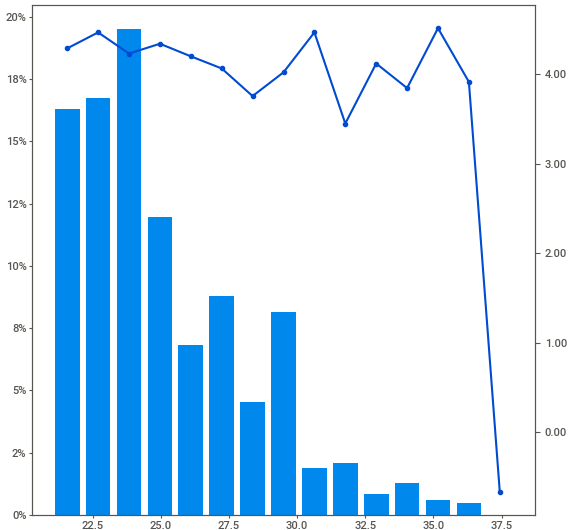
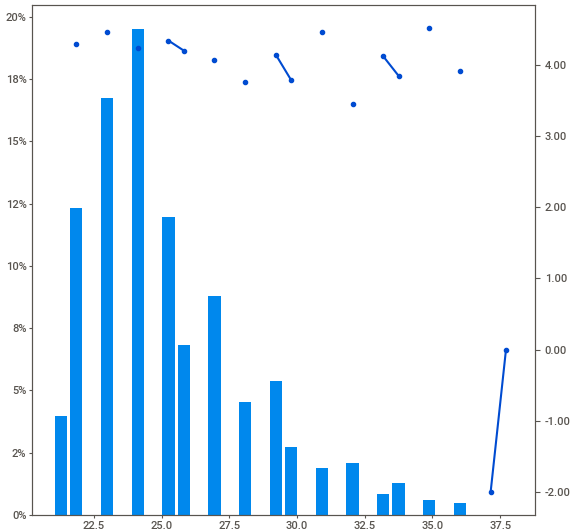
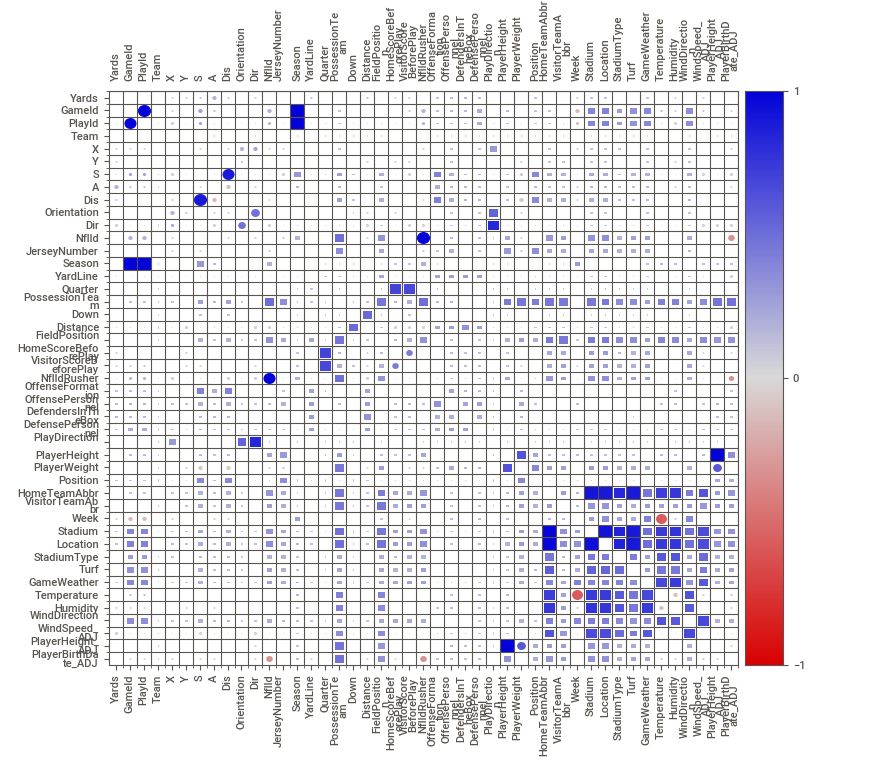
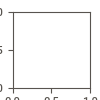

In [16]:
analyze_report = sv.analyze([data,'Train'], 'Yards')
analyze_report.show_notebook()

# Missing Values

### FieldPosition

In [17]:
data['FieldPosition'].unique()

array(['NE', 'KC', nan, 'BUF', 'NYJ', 'ATL', 'CHI', 'CIN', 'BLT', 'CLV',
       'PIT', 'ARZ', 'DET', 'JAX', 'HST', 'TEN', 'OAK', 'WAS', 'PHI',
       'LA', 'IND', 'GB', 'SEA', 'CAR', 'SF', 'DAL', 'NYG', 'NO', 'MIN',
       'DEN', 'LAC', 'TB', 'MIA'], dtype=object)

In [18]:
idx = data['FieldPosition'].isnull()
data.loc[idx, 'YardLine'].unique()

array([50])

**Conclusion**: Leave missing values since these are occuring because the football is on the 50-yard line which 
technically isn't on either team's side. When one-hot encoding this featuer later, include missing values as a category. Also I will likely remove this column and instead create a feature which indicates whether or not the ball is on the opponent's side or not with missing values representing the 50-yard line.

### OffenseFormation

In [19]:
data['OffenseFormation'].unique()

array(['SHOTGUN', 'SINGLEBACK', 'JUMBO', 'PISTOL', 'I_FORM', 'ACE',
       'WILDCAT', nan, 'EMPTY'], dtype=object)

**Conclusion**: There are only 4 rows that have this value missing. My hypothesis is that this was a unique formation that doesn't fall into one of the other formations. Therefore, I will keep these missing values since these will be treated as an "Other" category and include it as a feature when one-hot encoding.

### DefendersInTheBox

In [20]:
idx = data['DefendersInTheBox'].isnull()
data[idx]

,GameId,PlayId,Team,X,Y,S,A,Dis,Orientation,Dir,NflId,DisplayName,JerseyNumber,Season,YardLine,Quarter,GameClock,PossessionTeam,Down,Distance,FieldPosition,HomeScoreBeforePlay,VisitorScoreBeforePlay,NflIdRusher,OffenseFormation,OffensePersonnel,DefendersInTheBox,DefensePersonnel,PlayDirection,TimeHandoff,TimeSnap,Yards,PlayerHeight,PlayerWeight,PlayerBirthDate,PlayerCollegeName,Position,HomeTeamAbbr,VisitorTeamAbbr,Week,Stadium,Location,StadiumType,Turf,GameWeather,Temperature,Humidity,WindDirection,WindSpeed_ADJ,PlayerHeight_ADJ,PlayerBirthDate_ADJ
21929,2018122302,20181223022860,away,59.79,23.56,4.16,2.96,0.4,275.25,304.97,2543743,Carlos Hyde,34,2018,46,3,00:05:00,JAX,1,10,MIA,7,7,2543743,NaN,"1 RB, 1 TE, 3 WR",NaN,"4 DL, 3 LB, 4 DB",left,2018-12-23T20:10:10.000Z,2018-12-23T20:10:09.000Z,3,6-0,229,09/20/1990,Ohio State,RB,MIA,JAX,16,Hard Rock Stadium,"Miami Gardens, Fla.",Outdoor,Natural Grass,Sunny,73.0,49.0,NNE,9.0,72,28


**Conclusion**: There is only one missing value but I can use domain knowledge to impute this instead of simply removing it. Usually the DLs and LBs are in the box so we should be able to calculate this based on the DefensePersonnel column. First I'll check to see how often this is true based on the diference and if it isn't substantial then impute it for this row (which would be 7).

In [21]:
lst_def_in_box = []
for i in tqdm(range(data.shape[0]), desc=f'Looping over {data.shape[0]} instances'):
    value = data.loc[i, 'DefensePersonnel']
    #DefensePersonel follows the same structure so we can split the string and pull out the number of DLs and LBs
    tmp_lst = value.split()
    def_in_box = int(tmp_lst[0]) + int(tmp_lst[2])
    lst_def_in_box.append(def_in_box)
assert len(lst_def_in_box) == data.shape[0], 'Lengths are different'

Looping over 31007 instances: 100%|█| 31007/31007 [00:00<00:00, 104067.12it/s


In [22]:
data['DefendersInTheBox_IMP'] = lst_def_in_box

<AxesSubplot:>

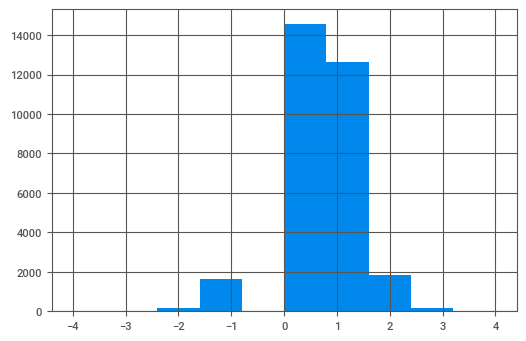

In [23]:
diff = data['DefendersInTheBox'] - data['DefendersInTheBox_IMP']
diff.hist()

Imputation is pretty close so will use this to correct missing value

In [24]:
data['DefendersInTheBox_ADJ'] = data['DefendersInTheBox']
idx = data['DefendersInTheBox_ADJ'].isnull()
data.loc[idx, 'DefendersInTheBox_ADJ'] = data.loc[idx, 'DefendersInTheBox_IMP']
sum(data['DefendersInTheBox_ADJ'].isnull())

0

### StadiumType

In [25]:
data.groupby('StadiumType')['GameId'].count()

StadiumType
Bowl                            44
Closed Dome                     97
Cloudy                          35
Dome                          1051
Dome, closed                    83
Domed                           83
Domed, Open                     80
Domed, closed                  314
Domed, open                    168
Heinz Field                     41
Indoor                         870
Indoor, Open Roof               39
Indoor, Roof Closed             48
Indoor, roof open               33
Indoors                       2583
OUTDOOR                         57
Open                           514
Oudoor                          54
Ourdoor                         39
Outddors                        44
Outdoor                      16478
Outdoor Retr Roof-Open          40
Outdoors                      4214
Outdor                          39
Outside                         37
Retr. Roof - Closed            293
Retr. Roof - Open               40
Retr. Roof Closed               48
Retr. Ro

Need to clean-up these values along with correcting the missing values

In [26]:
data['StadiumType'].unique()

array(['Outdoor', 'Outdoors', 'Indoors', 'Retractable Roof', 'Indoor',
       'Retr. Roof-Closed', 'Open', nan, 'Indoor, Open Roof',
       'Retr. Roof - Closed', 'Outddors', 'Dome', 'Domed, closed',
       'Indoor, Roof Closed', 'Retr. Roof Closed',
       'Outdoor Retr Roof-Open', 'Closed Dome', 'Oudoor', 'Ourdoor',
       'Dome, closed', 'Retr. Roof-Open', 'Heinz Field', 'Outdor',
       'Retr. Roof - Open', 'Domed, Open', 'Domed, open', 'Cloudy',
       'Bowl', 'Outside', 'Domed', 'Indoor, roof open', 'indoor',
       'Retractable Roof - Closed', 'OUTDOOR'], dtype=object)

In [27]:
idx = data['Stadium'] == 'Dignity Health Sports Park'
data.loc[idx, 'StadiumType'].unique()

array([nan], dtype=object)

In [28]:
# Based on the stadium, assign it to a specific StadiumType
missing_dict={'StubHub Center':'Outdoor', 
              'MetLife Stadium':'Outdoor',
              'TIAA Bank Field':'Outdoor',
              'Dignity Health Sports Park':'Outdoor'}

In [29]:
# Normalize categories based on domain knowledge
cleanup_dict={'Outdoor':'Outdoor', 
              'Outdoors':'Outdoor',
              'Indoors':'Indoor', 
              'Retractable Roof':'Retractable Roof', 
              'Indoor':'Indoor',
              'Retr. Roof-Closed':'Retractable Roof - Closed',
              'Open':'Outdoor',
              'Indoor, Open Roof':'Retractable Roof - Opened',
              'Retr. Roof - Closed':'Retractable Roof - Closed', 
              'Outddors':'Outdoor', 
              'Dome':'Indoor', 
              'Domed, closed':'Retractable Roof - Closed',
              'Indoor, Roof Closed':'Retractable Roof - Closed', 
              'Retr. Roof Closed':'Retractable Roof - Closed',
              'Outdoor Retr Roof-Open':'Retractable Roof - Opened',
              'Closed Dome':'Retractable Roof - Closed',
              'Oudoor':'Outdoor',
              'Ourdoor':'Outdoor',
              'Dome, closed':'Retractable Roof - Closed',
              'Retr. Roof-Open':'Retractable Roof - Opened', 
              'Heinz Field':'Outdoor', 
              'Outdor':'Outdoor',
              'Retr. Roof - Open':'Retractable Roof - Opened', 
              'Domed, Open':'Retractable Roof - Opened', 
              'Domed, open':'Retractable Roof - Opened', 
              'Cloudy':'Outdoor',
              'Bowl':'Outdoor', 
              'Outside':'Outdoor', 
              'Domed':'Indoor', 
              'Indoor, roof open':'Retractable Roof - Opened', 
              'indoor':'Indoor',
              'Retractable Roof - Closed':'Retractable Roof - Closed', 
              'OUTDOOR':'Outdoor'
             }

In [30]:
lst_stadium_type = []
for i in tqdm(range(data.shape[0]), desc=f'Looping over {data.shape[0]} instances'):
    value = data.loc[i, 'StadiumType']
    if value is np.nan:
        tmp_value = data.loc[i, 'Stadium']
        lst_stadium_type.append(missing_dict[tmp_value])
    else:
        lst_stadium_type.append(cleanup_dict[value])
assert len(lst_stadium_type) == data.shape[0], 'Lengths are different'

Looping over 31007 instances: 100%|█| 31007/31007 [00:00<00:00, 107236.59it/s


In [31]:
data['StadiumType_ADJ'] = lst_stadium_type
sum(data['StadiumType_ADJ'].isnull())

0

### GameWeather

In [32]:
data['GameWeather'].unique()

array(['Clear and warm', 'Sun & clouds', 'Sunny', 'Controlled Climate',
       'Mostly Sunny', 'Clear', nan, 'Indoor', 'Mostly Cloudy',
       'Mostly Coudy', 'Partly sunny', 'Partly Cloudy', 'Cloudy',
       'Sunny, highs to upper 80s', 'Indoors', 'Light Rain', 'Showers',
       'Partly cloudy', 'Partly Sunny', '30% Chance of Rain',
       'Cloudy with periods of rain, thunder possible. Winds shifting to WNW, 10-20 mph.',
       'Rain', 'Cloudy, fog started developing in 2nd quarter', 'Coudy',
       'Rain likely, temps in low 40s.', 'Cold', 'N/A (Indoors)',
       'Clear skies', 'cloudy', 'Fair', 'Mostly cloudy',
       'Cloudy, chance of rain', 'Heavy lake effect snow', 'Party Cloudy',
       'Cloudy, light snow accumulating 1-3"', 'Cloudy and cold', 'Snow',
       'Hazy', 'Scattered Showers', 'Cloudy and Cool', 'N/A Indoor',
       'Rain Chance 40%', 'Clear and sunny', 'Mostly sunny',
       'Sunny and warm', 'Partly clear', 'Cloudy, 50% change of rain',
       'Clear and Sunny', '

A lot of GameWeather values are inconsitent so I'll clean these up as part of the imputation.

In [33]:
idx = data['GameWeather'].isnull()
data.loc[idx].groupby('StadiumType_ADJ')['GameId'].count()

StadiumType_ADJ
Indoor                       1242
Outdoor                       894
Retractable Roof - Closed     446
Retractable Roof - Opened     153
Name: GameId, dtype: int64

**Concluions**:"Indoor" and "Retractable Roof - Closed" for the stadium type make up the majority of missing values for game weather. I'll convert these to "Indoor" for the GameWeather while also cleaning up the values. 

Also "Retractable Roof - Opened" implies the weather is nice since the roof is open so I will default these to "Clear".

Finally, I will default all other missing values to clear since a lack of values may indicate normal weather conditions.

In [34]:
missing_dict = {
    'Indoor':'Indoor',
    'Retractable Roof - Closed':'Indoor',
    'Retractable Roof - Opened':'Clear',
    'Outdoor':'Indoor'
}

In [35]:
cleanup_dict = {
        'Clear and warm': 'Clear', 
        'Sun & clouds': 'Mostly Sunny', 
        'Sunny':'Sunny', 
        'Controlled Climate':'Indoor',
        'Mostly Sunny':'Mostly Sunny', 
        'Clear':'Clear',
        'Indoor':'Indoor', 
        'Mostly Cloudy':'Mostly Cloudy',
        'Mostly Coudy':'Mostly Cloudy', 
        'Partly sunny': 'Partly Sunny', 
        'Partly Cloudy': 'Partly Cloudy', 
        'Cloudy':'Cloudy',
        'Sunny, highs to upper 80s':'Sunny', 
        'Indoors':'Indoor', 
        'Light Rain':'Light Rain', 
        'Showers':'Rain',
        'Partly cloudy':'Partly Cloudy', 
        'Partly Sunny':'Partly Sunny',
        '30% Chance of Rain':'Cloudy',
        'Cloudy with periods of rain, thunder possible. Winds shifting to WNW, 10-20 mph.':'Cloudy',
        'Rain':'Rain', 
        'Cloudy, fog started developing in 2nd quarter':'Cloudy', 
        'Coudy':'Cloudy',
        'Rain likely, temps in low 40s.':'Rain',
        'Cold':'Cloudy',
        'N/A (Indoors)':'Indoor',
        'Clear skies':'Clear', 
        'cloudy':'Cloudy', 
        'Fair':'Clear', 
        'Mostly cloudy':'Mostly Cloudy',
        'Cloudy, chance of rain':'Cloudy', 
        'Heavy lake effect snow':'Snow', 
        'Party Cloudy':'Partly Cloudy',
        'Cloudy, light snow accumulating 1-3"':'Snow', 
        'Cloudy and cold':'Cloudy', 
        'Snow':'Snow',
        'Hazy':'Cloudy', 
        'Scattered Showers':'Light Rain', 
        'Cloudy and Cool':'Cloudy', 
        'N/A Indoor':'Indoor',
        'Rain Chance 40%':'Light Rain', 
        'Clear and sunny':'Sunny', 
        'Mostly sunny':'Mostly Sunny',
        'Sunny and warm':'Sunny',
        'Partly clear':'Partly Sunny', 
        'Cloudy, 50% change of rain':'Rain',
        'Clear and Sunny':'Sunny', 
        'Sunny, Windy':'Sunny', 
        'Clear and Cool':'Clear',
        'Sunny and clear':'Sunny', 
        'Mostly Sunny Skies':'Mostly Sunny',
        'Partly Clouidy':'Partly Cloudy',
        'Clear Skies':'Clear',
        'Sunny Skies':'Sunny',
        'Overcast':'Partly Cloudy',
        'T: 51; H: 55; W: NW 10 mph':'Clear', 
        'Cloudy, Rain':'Rain', 
        'Rain shower':'Rain',
        'Clear and cold':'Clear', 
        'Rainy':'Rain', 
        'Sunny and cold':'Sunny',
        'Partly cloudy and mild':'Partly Cloudy',
        'Breezy':'Clear', 
        'Light rain':'Light Rain',
        'partly cloudy':'Partly Cloudy',
        'Mostly Clear':'Mostly Clear', 
        'N/A Indoors':'Indoor', 
        'sUNNY':'Sunny',
        'Cloudy with showers and wind':'Rain', 
        'overcast':'Partly Cloudy', 
        'Mostly clear':'Mostly Clear',
        'Raining':'Rain', 
        'Rain and Wind':'Rain'
}

In [36]:
lst_game_weather = []
for i in tqdm(range(data.shape[0]), desc=f'Looping over {data.shape[0]} instances'):
    value = data.loc[i, 'GameWeather']
    if value is np.nan:
        tmp_value = data.loc[i, 'StadiumType_ADJ']
        lst_game_weather.append(missing_dict[tmp_value])
    else:
        lst_game_weather.append(cleanup_dict[value])
assert len(lst_game_weather) == data.shape[0], 'Lengths are different'

Looping over 31007 instances: 100%|█| 31007/31007 [00:00<00:00, 104355.38it/s


In [37]:
data['GameWeather_ADJ'] = lst_game_weather
sum(data['GameWeather_ADJ'].isnull())

0

### Temperature

In [38]:
data['Temperature'].unique()

array([63., 65., 64., 68., 80., 72., 67., 90., 71., 87., nan, 70., 73.,
       69., 83., 78., 84., 85., 88., 76., 82., 89., 61., 91., 77., 60.,
       57., 62., 74., 52., 54., 86., 79., 75., 56., 42., 39., 50., 44.,
       36., 35., 53., 48., 49., 40., 33., 38., 28., 66., 81., 45., 46.,
       47., 58., 32., 41., 31., 29., 55., 25., 22., 51., 10., 24., 23.,
       43., 19.,  9., 13., 16., 11., 17., 59., 92., 97., 37., 34., 27.,
       26., 93.])

<AxesSubplot:>

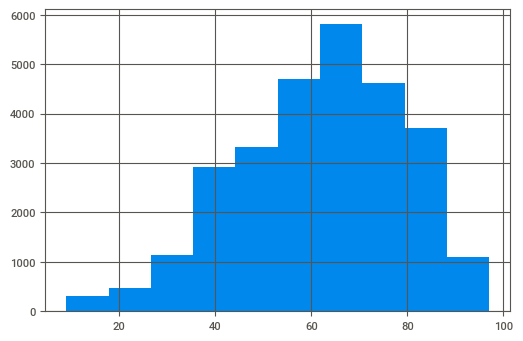

In [39]:
data['Temperature'].hist()

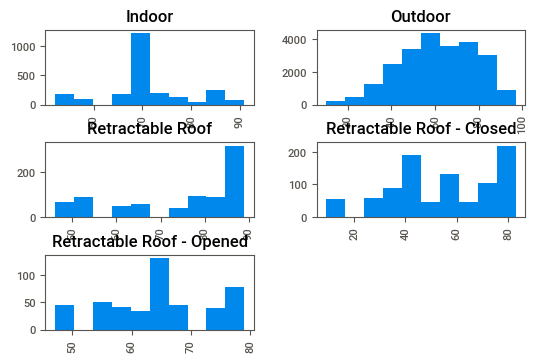

In [40]:
data['Temperature'].hist(by=data['StadiumType_ADJ']);

In [41]:
idx = data['Temperature'].isnull()
data.loc[idx,'StadiumType_ADJ'].unique()

array(['Indoor', 'Retractable Roof - Closed', 'Retractable Roof',
       'Retractable Roof - Opened'], dtype=object)

**Conclusions**: Missing values are associated with stadiums that are either indoors or had a retractable roof. Therefore, I will assume that the temperature is the median value for the corresponding stadium type.

In [42]:
stadium_type_lst = ['Indoor', 'Retractable Roof - Closed', 'Retractable Roof','Retractable Roof - Opened']
stadiam_type_median_temp_dict = {}

for s in stadium_type_lst:
    idx = data['StadiumType_ADJ'] == s
    tmp_df = data[idx]
    stadiam_type_median_temp_dict[s] = tmp_df['Temperature'].median()
stadiam_type_median_temp_dict

{'Indoor': 68.0,
 'Retractable Roof - Closed': 57.0,
 'Retractable Roof': 83.0,
 'Retractable Roof - Opened': 66.0}

In [43]:
tmp_df = data.loc[idx,'Temperature']
np.isnan(tmp_df.iloc[0])

False

In [44]:
lst_temp = []
for i in tqdm(range(data.shape[0]), desc=f'Looping over {data.shape[0]} instances'):
    value = data.loc[i, 'Temperature']
    if np.isnan(value):
        tmp_value = data.loc[i, 'StadiumType_ADJ']
        lst_temp.append(stadiam_type_median_temp_dict[tmp_value])
    else:
        lst_temp.append(value)
assert len(lst_temp) == data.shape[0], 'Lengths are different'

Looping over 31007 instances: 100%|█| 31007/31007 [00:00<00:00, 78383.20it/s]


In [45]:
data['Temperature_IMP'] = lst_temp
sum(data['Temperature_IMP'].isnull())

0

### Humidity

In [46]:
idx = data['Humidity'].isnull()
data.loc[idx, 'Stadium'].unique()

array(['Mercedes-Benz Stadium', 'AT&T Stadium', 'State Farm Stadium',
       'U.S. Bank Stadium'], dtype=object)

<AxesSubplot:>

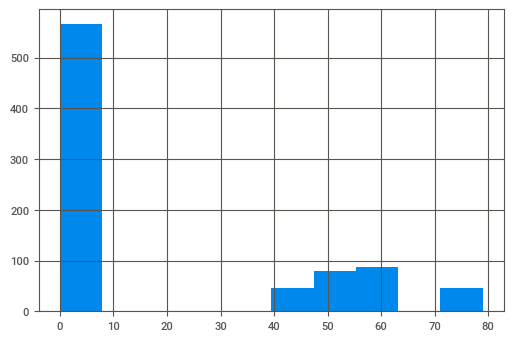

In [47]:
idx = data['Stadium'] == 'Mercedes-Benz Stadium'
data.loc[idx, 'Humidity'].hist()

<AxesSubplot:>

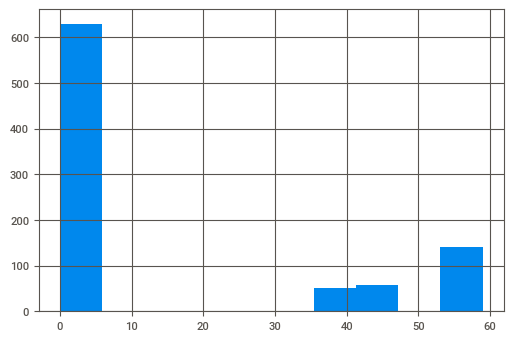

In [48]:
idx = data['Stadium'] == 'AT&T Stadium'
data.loc[idx, 'Humidity'].hist()

<AxesSubplot:>

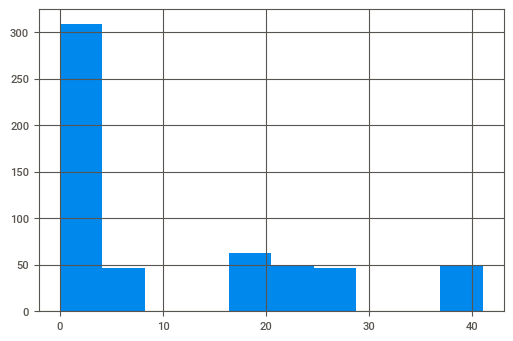

In [49]:
idx = data['Stadium'] == 'State Farm Stadium'
data.loc[idx, 'Humidity'].hist()

<AxesSubplot:>

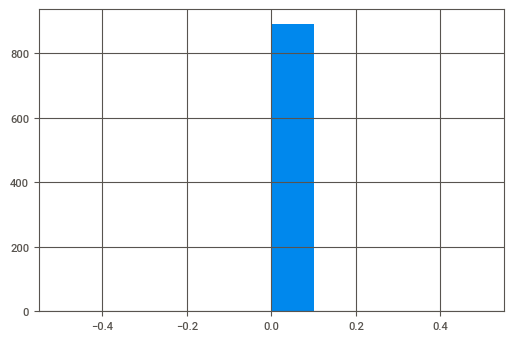

In [50]:
idx = data['Stadium'] == 'U.S. Bank Stadium'
data.loc[idx, 'Humidity'].hist()

**Conclusion**: For the stadiums that have missing humidity, the median value is around zero. To keep things simple, I will impute the missing values as zero.

In [51]:
idx = data['Humidity'].isnull()
data['Humidity_IMP'] = data['Humidity']
data.loc[idx, 'Humidity_IMP'] = 0
sum(data['Humidity_IMP'].isnull())

0

### WindSpeed_ADJ

<AxesSubplot:>

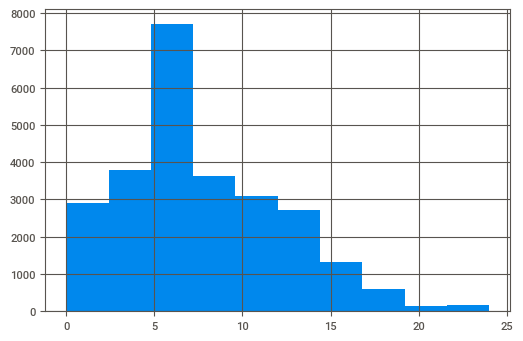

In [52]:
data['WindSpeed_ADJ'].hist()

**Conclusion**: For missing WindSpeed, assume these are zero.

In [53]:
idx = data['WindSpeed_ADJ'].isnull()
data['WindSpeed_IMP'] = data['WindSpeed_ADJ']
data.loc[idx, 'WindSpeed_IMP'] = 0
sum(data['Humidity_IMP'].isnull())

0

# Rerun Sweetviz to evaluate imputations

                                             |   | [  0%]   00:00 -> (? left)


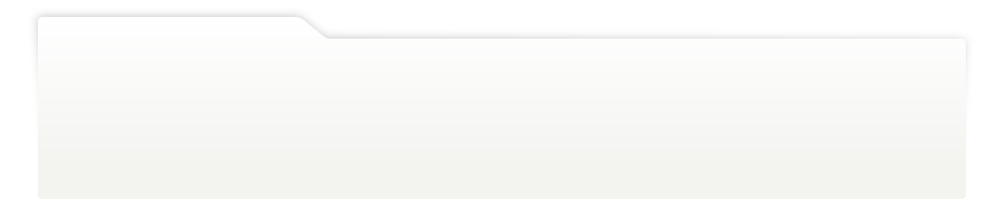
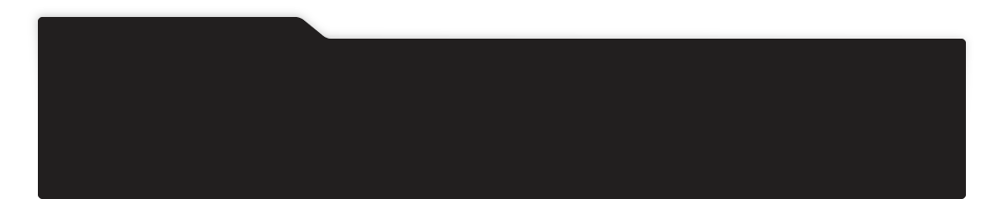
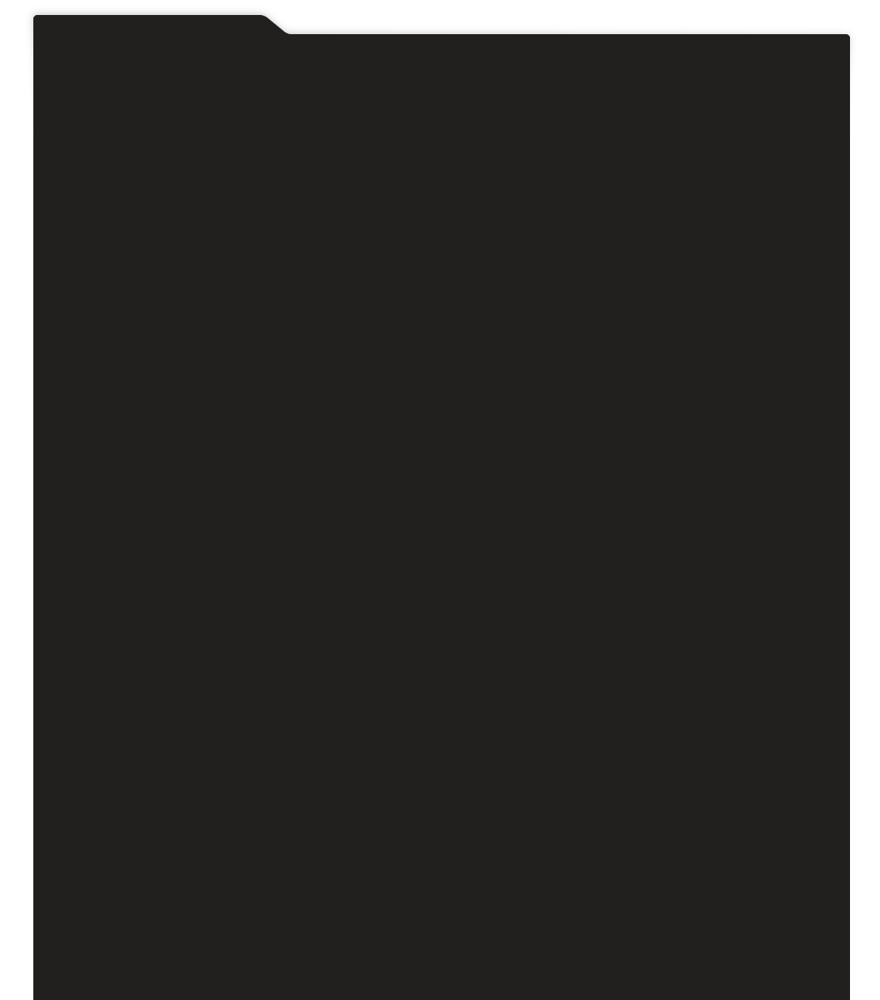
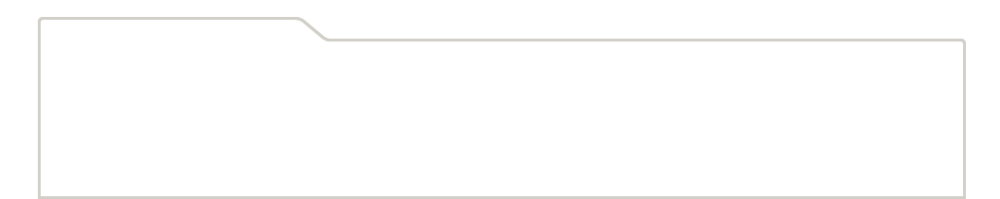
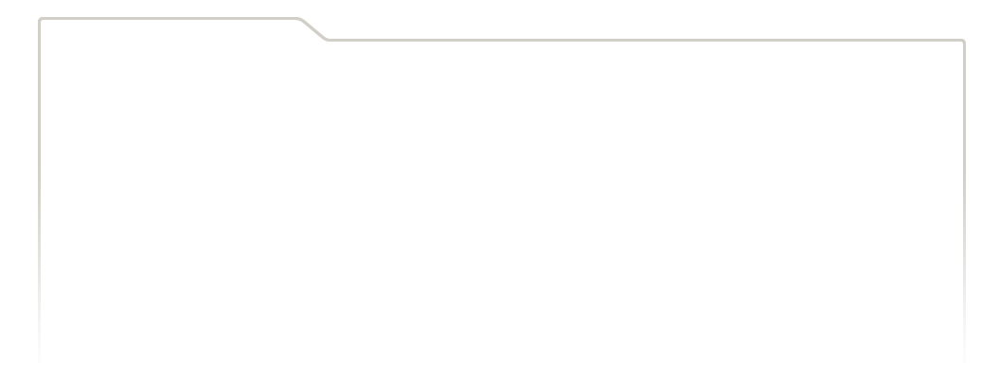
...
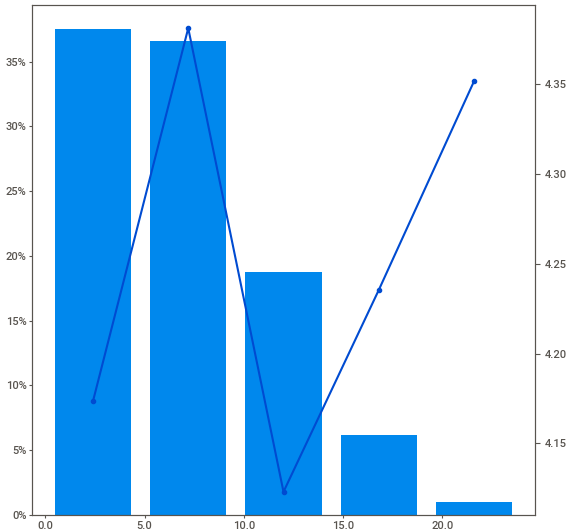
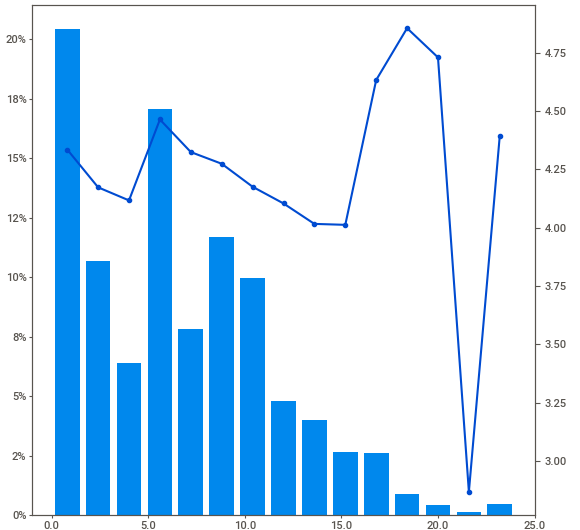
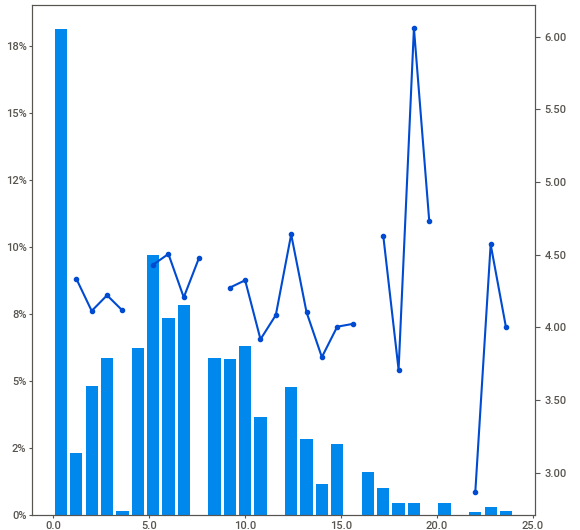
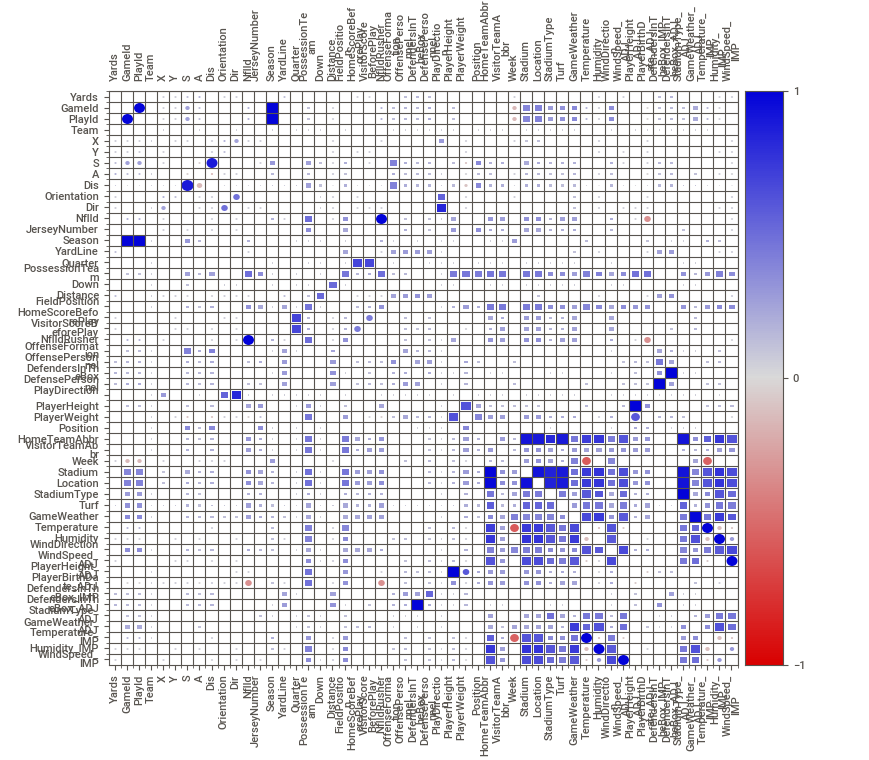
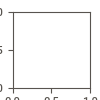

In [54]:
analyze_report = sv.analyze([data,'Train'], 'Yards')
analyze_report.show_notebook()

# One-hot Encoding

One-hot encode categorical variables. Only choosing those categorical variables which I think will be useful for analysis (i.e. not including ID columns).

In [55]:
# Filter columns that are useful for this analysis
id_cols = ['GameId', 'PlayId', 'NflIdRusher']

info_cols =['DisplayName', 'Season']

quant_cols = ['Yards','X', 'Y', 'YardLine', 'HomeScoreBeforePlay', 'VisitorScoreBeforePlay', 'DefendersInTheBox_IMP',
             'PlayerWeight', 'PlayerHeight_ADJ', 'Temperature_IMP', 'Humidity_IMP', 'WindSpeed_IMP']

cat_cols = ['Team', 'Quarter', 'Down', 'OffenseFormation', 'OffensePersonnel', 'DefensePersonnel',
           'PlayDirection', 'StadiumType_ADJ', 'GameWeather_ADJ']

cat_cols = ['Team', 'Quarter', 'Down', 'OffenseFormation', 'PlayDirection', 'StadiumType_ADJ', 'GameWeather_ADJ']
final_cols = id_cols + info_cols + quant_cols + cat_cols

preprocess_data = data[final_cols]

In [56]:
#One-hot encode categorical variables
preprocess_data = pd.get_dummies(preprocess_data, prefix=cat_cols, dummy_na=True, columns=cat_cols)
preprocess_data.head()

,GameId,PlayId,NflIdRusher,DisplayName,Season,Yards,X,Y,YardLine,HomeScoreBeforePlay,VisitorScoreBeforePlay,DefendersInTheBox_IMP,PlayerWeight,PlayerHeight_ADJ,Temperature_IMP,Humidity_IMP,WindSpeed_IMP,Team_away,Team_home,Team_nan,Quarter_1.0,Quarter_2.0,Quarter_3.0,Quarter_4.0,Quarter_5.0,Quarter_nan,Down_1.0,Down_2.0,Down_3.0,Down_4.0,Down_nan,OffenseFormation_ACE,OffenseFormation_EMPTY,OffenseFormation_I_FORM,OffenseFormation_JUMBO,OffenseFormation_PISTOL,OffenseFormation_SHOTGUN,OffenseFormation_SINGLEBACK,OffenseFormation_WILDCAT,OffenseFormation_nan,PlayDirection_left,PlayDirection_right,PlayDirection_nan,StadiumType_ADJ_Indoor,StadiumType_ADJ_Outdoor,StadiumType_ADJ_Retractable Roof,StadiumType_ADJ_Retractable Roof - Closed,StadiumType_ADJ_Retractable Roof - Opened,StadiumType_ADJ_nan,GameWeather_ADJ_Clear,GameWeather_ADJ_Cloudy,GameWeather_ADJ_Indoor,GameWeather_ADJ_Light Rain,GameWeather_ADJ_Mostly Clear,GameWeather_ADJ_Mostly Cloudy,GameWeather_ADJ_Mostly Sunny,GameWeather_ADJ_Partly Cloudy,GameWeather_ADJ_Partly Sunny,GameWeather_ADJ_Rain,GameWeather_ADJ_Snow,GameWeather_ADJ_Sunny,GameWeather_ADJ_nan
0,2017090700,20170907000118,2543773,James White,2017,8,78.75,30.53,35,0,0,5,205,70,63.0,77.0,8.0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,2017090700,20170907000139,2543773,James White,2017,3,71.07,27.16,43,0,0,5,205,70,63.0,77.0,8.0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
2,2017090700,20170907000189,2543773,James White,2017,5,48.66,19.11,35,0,0,5,205,70,63.0,77.0,8.0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,2017090700,20170907000345,2539663,Mike Gillislee,2017,2,15.53,25.36,2,0,0,8,210,71,63.0,77.0,8.0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,2017090700,20170907000395,2557917,Kareem Hunt,2017,7,29.99,27.12,25,7,0,5,216,71,63.0,77.0,8.0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


# Export Preprocessing File

In [57]:
preprocess_data.to_csv('../data/preprocess_data.csv', index=False)

# Answer Analytics Questions:

### Which team and player had the most rushing yards?

In [75]:
team_rush_yrds = data.groupby('PossessionTeam')['Yards'].sum().sort_values(ascending=False)
team_rush_yrds

PossessionTeam
LA     4875
NO     4870
SF     4862
BLT    4843
NE     4820
MIN    4668
DAL    4651
DEN    4530
SEA    4440
PHI    4418
IND    4356
LAC    4335
OAK    4262
CAR    4179
JAX    4112
TEN    4085
HST    4071
CLV    4067
KC     3978
BUF    3927
NYG    3916
ATL    3810
PIT    3737
CHI    3703
GB     3643
DET    3560
NYJ    3538
WAS    3492
CIN    3449
MIA    3343
ARZ    3343
TB     3203
Name: Yards, dtype: int64

<AxesSubplot:xlabel='Team', ylabel='Rushing Yards'>

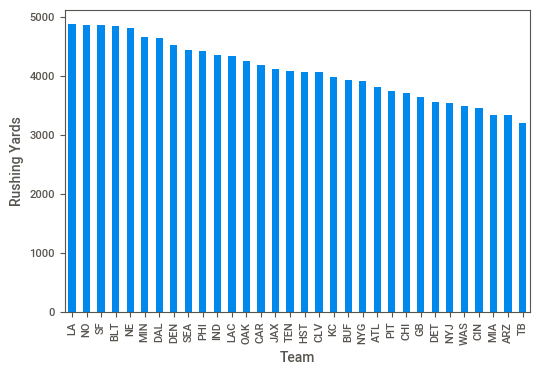

In [76]:
team_rush_yrds.plot.bar(ylabel='Rushing Yards', xlabel='Team')

**Team**: LA has the most rushing yards with 4,875 yards barely beating NO which had 4,870 yards

In [77]:
player_rush_yrds = data.groupby('DisplayName')['Yards'].sum().sort_values(ascending=False)
player_rush_yrds

DisplayName
Ezekiel Elliott        3283
Todd Gurley            3054
Christian McCaffrey    2613
Derrick Henry          2608
Jordan Howard          2543
                       ... 
Antonio Callaway         -8
Michael Thomas           -9
Rod Streater            -11
Noah Fant               -12
Josh Doctson            -14
Name: Yards, Length: 445, dtype: int64

<AxesSubplot:xlabel='Top 20 Players', ylabel='Rushing Yards'>

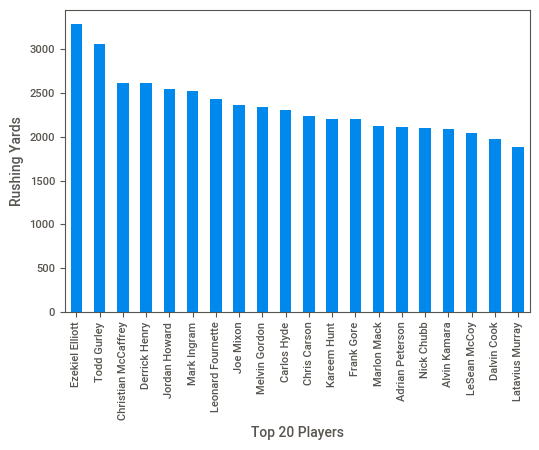

In [80]:
player_rush_yrds[:20].plot.bar(ylabel='Rushing Yards', xlabel='Top 20 Players')

**Player**: Ezekiel Elliott had the most rushing yards with 3,283 and Todd Gurley had the second most with 3,054

### Which offensive personal and defensive personal led to the most rushing yards?

In [60]:
data.groupby('OffensePersonnel')['Yards'].sum().sort_values(ascending=False)

OffensePersonnel
1 RB, 1 TE, 3 WR          63750
1 RB, 2 TE, 2 WR          28229
2 RB, 1 TE, 2 WR          14352
1 RB, 3 TE, 1 WR           6697
2 RB, 2 TE, 1 WR           6588
                          ...  
1 RB, 4 TE, 0 WR              0
6 OL, 0 RB, 2 TE, 2 WR       -1
7 OL, 1 RB, 1 TE, 1 WR       -1
2 RB, 2 TE, 0 WR,1 DL        -2
0 RB, 3 TE, 2 WR             -2
Name: Yards, Length: 61, dtype: int64

In [61]:
data.groupby('OffensePersonnel')['Yards'].count().sort_values(ascending=False)

OffensePersonnel
1 RB, 1 TE, 3 WR          14104
1 RB, 2 TE, 2 WR           7056
2 RB, 1 TE, 2 WR           3262
1 RB, 3 TE, 1 WR           1798
2 RB, 2 TE, 1 WR           1589
                          ...  
2 QB, 3 RB, 1 TE, 0 WR        1
2 QB, 2 RB, 2 TE, 0 WR        1
1 RB, 3 TE, 0 WR,1 DB         1
1 RB, 2 TE, 3 WR              1
2 RB, 1 TE, 1 WR,1 DB         1
Name: Yards, Length: 61, dtype: int64

In [62]:
data.groupby('OffensePersonnel')['Yards'].mean().sort_values(ascending=False)

OffensePersonnel
1 RB, 0 TE, 3 WR,1 DB          12.333333
1 RB, 1 TE, 2 WR,1 DB           8.818182
2 QB, 2 RB, 1 TE, 1 WR          7.800000
0 RB, 2 TE, 3 WR                6.900000
2 QB, 2 RB, 2 TE, 0 WR          6.000000
                                 ...    
6 OL, 1 RB, 1 TE, 1 WR,1 LB     0.000000
7 OL, 1 RB, 1 TE, 1 WR         -0.500000
0 RB, 3 TE, 2 WR               -0.666667
6 OL, 0 RB, 2 TE, 2 WR         -1.000000
2 RB, 2 TE, 0 WR,1 DL          -1.000000
Name: Yards, Length: 61, dtype: float64

In [63]:
idx = data['OffensePersonnel'] == '1 RB, 0 TE, 3 WR,1 DB'
sum(idx)

3

**Offense Personnel**: The offensive personnel with the most yards is "1 RB, 1 TE, 3 WR". However, this occurs because this personnel is the most common and shows up almost twice as much as the next most frequent personnel. Looking at the average yards per personnel, "1 RB, 0 TE, 3 WR, 1 DB" averages 12 yards per play and is 50% higher than the next highest. Still, this type of personnel is very uncommon with only 3 instances in the data where this is occuring. 

In [64]:
data.groupby('DefensePersonnel')['Yards'].sum().sort_values(ascending=False)

DefensePersonnel
4 DL, 2 LB, 5 DB          36355
4 DL, 3 LB, 4 DB          31267
3 DL, 4 LB, 4 DB          20076
2 DL, 4 LB, 5 DB          16117
3 DL, 3 LB, 5 DB          15219
2 DL, 3 LB, 6 DB           4058
4 DL, 1 LB, 6 DB           2469
5 DL, 2 LB, 4 DB           1446
3 DL, 2 LB, 6 DB           1223
1 DL, 4 LB, 6 DB            572
4 DL, 4 LB, 3 DB            568
3 DL, 5 LB, 3 DB            282
5 DL, 3 LB, 3 DB            231
1 DL, 5 LB, 5 DB            195
2 DL, 2 LB, 7 DB            156
1 DL, 3 LB, 7 DB            148
5 DL, 1 LB, 5 DB            131
2 DL, 4 LB, 4 DB, 1 RB      116
2 DL, 5 LB, 4 DB             86
3 DL, 1 LB, 7 DB             56
5 DL, 4 LB, 2 DB             51
6 DL, 3 LB, 2 DB             35
0 DL, 4 LB, 7 DB             34
1 DL, 4 LB, 5 DB, 1 RB       27
0 DL, 5 LB, 6 DB             25
6 DL, 4 LB, 1 DB             23
2 DL, 4 LB, 4 DB, 1 OL       19
1 DL, 3 LB, 6 DB, 1 RB       13
4 DL, 5 LB, 2 DB             12
1 DL, 2 LB, 8 DB             11
4 DL, 3 LB, 5 DB       

In [65]:
data.groupby('DefensePersonnel')['Yards'].count().sort_values(ascending=False)

DefensePersonnel
4 DL, 2 LB, 5 DB          8054
4 DL, 3 LB, 4 DB          7875
3 DL, 4 LB, 4 DB          5019
2 DL, 4 LB, 5 DB          3699
3 DL, 3 LB, 5 DB          3406
2 DL, 3 LB, 6 DB           788
4 DL, 1 LB, 6 DB           475
5 DL, 2 LB, 4 DB           322
4 DL, 4 LB, 3 DB           295
3 DL, 2 LB, 6 DB           239
5 DL, 3 LB, 3 DB           146
1 DL, 4 LB, 6 DB           100
3 DL, 5 LB, 3 DB            76
5 DL, 4 LB, 2 DB            76
6 DL, 3 LB, 2 DB            64
6 DL, 4 LB, 1 DB            62
5 DL, 1 LB, 5 DB            50
1 DL, 5 LB, 5 DB            42
6 DL, 2 LB, 3 DB            40
2 DL, 5 LB, 4 DB            28
1 DL, 3 LB, 7 DB            23
2 DL, 2 LB, 7 DB            19
4 DL, 5 LB, 2 DB            16
5 DL, 5 LB, 1 DB            15
3 DL, 1 LB, 7 DB            13
2 DL, 4 LB, 4 DB, 1 RB      10
5 DL, 3 LB, 2 DB, 1 OL       7
1 DL, 4 LB, 5 DB, 1 RB       7
0 DL, 4 LB, 7 DB             6
0 DL, 5 LB, 6 DB             6
1 DL, 3 LB, 6 DB, 1 RB       4
4 DL, 6 LB, 1 DB      

In [66]:
data.groupby('DefensePersonnel')['Yards'].mean().sort_values(ascending=False)

DefensePersonnel
2 DL, 4 LB, 4 DB, 1 RB    11.600000
1 DL, 2 LB, 8 DB          11.000000
4 DL, 3 LB, 5 DB          11.000000
2 DL, 2 LB, 7 DB           8.210526
1 DL, 3 LB, 7 DB           6.434783
2 DL, 4 LB, 4 DB, 1 OL     6.333333
0 DL, 4 LB, 6 DB, 1 RB     6.000000
1 DL, 4 LB, 6 DB           5.720000
0 DL, 4 LB, 7 DB           5.666667
4 DL, 1 LB, 6 DB           5.197895
2 DL, 3 LB, 6 DB           5.149746
3 DL, 2 LB, 6 DB           5.117155
1 DL, 5 LB, 5 DB           4.642857
4 DL, 2 LB, 5 DB           4.513906
5 DL, 2 LB, 4 DB           4.490683
3 DL, 3 LB, 5 DB           4.468291
2 DL, 4 LB, 5 DB           4.357124
3 DL, 1 LB, 7 DB           4.307692
0 DL, 5 LB, 6 DB           4.166667
3 DL, 4 LB, 4 DB           4.000000
2 DL, 3 LB, 5 DB, 1 RB     4.000000
0 DL, 6 LB, 5 DB           4.000000
4 DL, 3 LB, 4 DB           3.970413
1 DL, 4 LB, 5 DB, 1 RB     3.857143
3 DL, 5 LB, 3 DB           3.710526
1 DL, 3 LB, 6 DB, 1 RB     3.250000
2 DL, 5 LB, 4 DB           3.071429
3 DL, 4 LB,

In [67]:
idx = data['DefensePersonnel'] == '2 DL, 4 LB, 4 DB, 1 RB'
sum(idx)

10

**Defense Personnel**: The "4 DL, 2 LB, 5 DB" leads to the most yards but it is also the most common. Looking at the average yards, "2 DL, 4 LB, 4 DB, 1 RB" has the highest average yards per play but there are only 10 plays with this type of personnel.